# Street Network Analysis - Islington, London, UK

### GEOG0015 Mining Social & Geographic Datasets

In [2]:
#load libraries 
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import osmnx as ox # this line imports osmnx
import networkx as nx # this line imports networkx
import matplotlib.cm as cm
import matplotlib.colors as colors
#from IPython.display import IFrame
#ox.config(log_console=True, use_cache=True)

import sys
print (f'current environment: {sys.prefix}')

if ox.__version__=='2.0.1':
    #prints OSMNx version 
    print (f'current osmnx version: {ox.__version__}') 
else:
    #recommends student to upgrade to newer osmnx version.
    print (f'current osmnx version: {ox.__version__}. student might need to upgrade to osmnx=2.0.1 for the notebook to work')


current environment: /opt/anaconda3/envs/envGEOG0051
current osmnx version: 2.0.1


### Load Graph

In [3]:
# Load graph of Islington for a walking street network and 2000m radius
G=ox.graph_from_address('Islington, London, UK', dist=2000, network_type='walk')

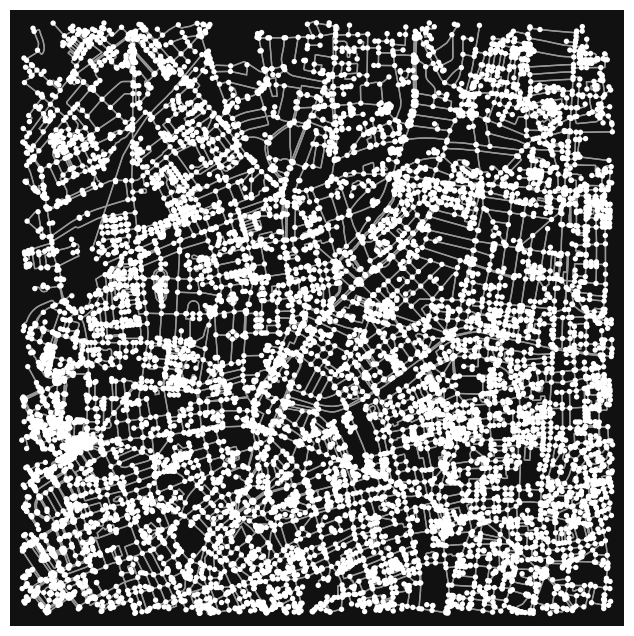

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [4]:
#plot the graph
ox.plot_graph(G)

### Betweenness Centrality

In [5]:
#first set as diGraph
DG = ox.convert.to_digraph(G)

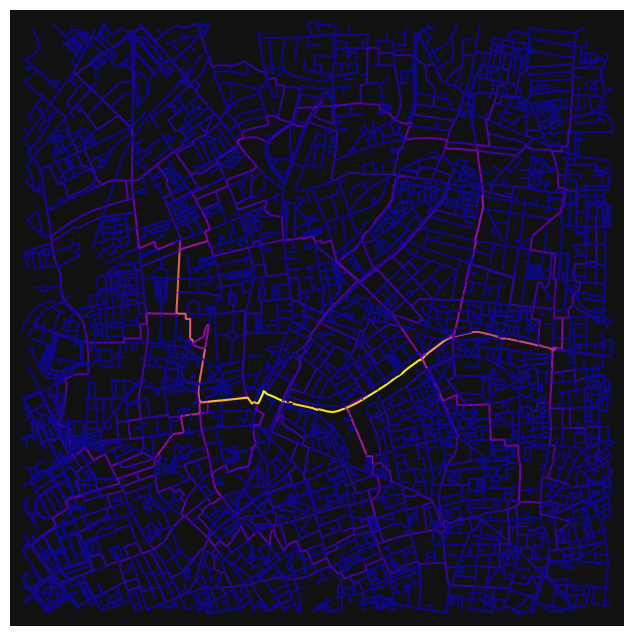

In [7]:
#calculate edge betweenness centrality
#convert graph to a line graph so edges become nodes and vice versa
edge_bc = nx.betweenness_centrality(nx.line_graph(DG))

#set measure of each node as edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_bc,'bc')
G1 = nx.MultiGraph(DG)

#set color & plot 
nc = ox.plot.get_edge_colors_by_attr(G1, 'bc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

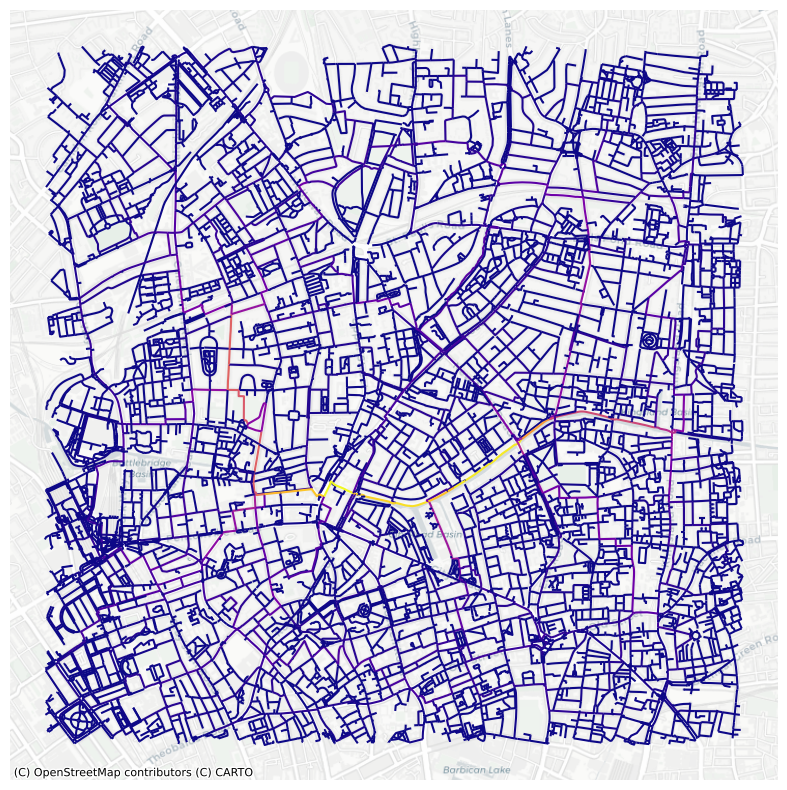

In [8]:
# convert graph to geopandas dataframe
gdf_edges = ox.graph_to_gdfs(G1,nodes=False,fill_edge_geometry=True)

# set crs to 3857 (needed for contextily)
gdf_edges = gdf_edges.to_crs(epsg=3857) # setting crs to 3857

# plot edges according to degree centrality
ax=gdf_edges.plot('bc',cmap='plasma',figsize=(10,10))

# add a basemap using contextilly
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

### Closeness Centrality

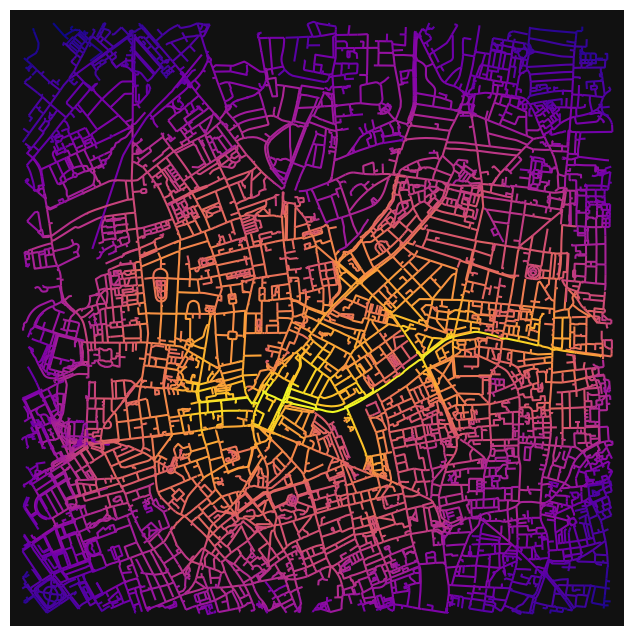

In [9]:
#calculate edge closeness centrality
#convert graph to a line graph so edges become nodes and vice versa
edge_cc = nx.closeness_centrality(nx.line_graph(DG))

#set measure of each node as edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_cc,'cc')
G2 = nx.MultiGraph(DG)

#set color & plot 
nc = ox.plot.get_edge_colors_by_attr(G2, 'cc', cmap='plasma')
fig, ax = ox.plot_graph(G2, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

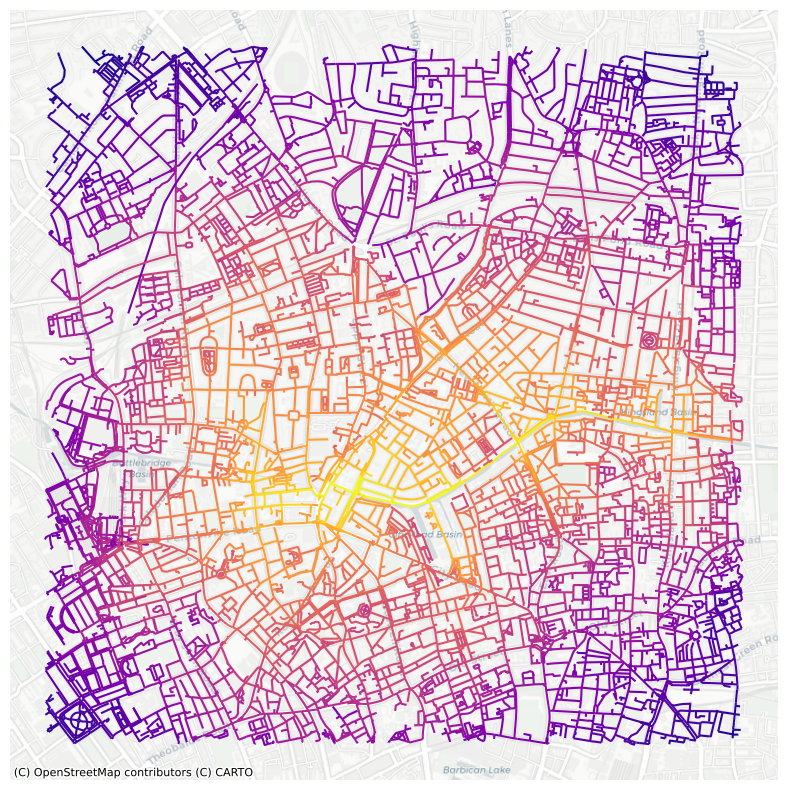

In [10]:
# convert graph to geopandas dataframe
gdf_edges2 = ox.graph_to_gdfs(G2,nodes=False,fill_edge_geometry=True)

# set crs to 3857 (needed for contextily)
gdf_edges2 = gdf_edges2.to_crs(epsg=3857) # setting crs to 3857

# plot edges according to degree centrality
ax2=gdf_edges2.plot('cc',cmap='plasma',figsize=(10,10))

# add a basemap using contextilly
import contextily as ctx
ctx.add_basemap(ax2,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

### Urban Form/Land Use Analysis

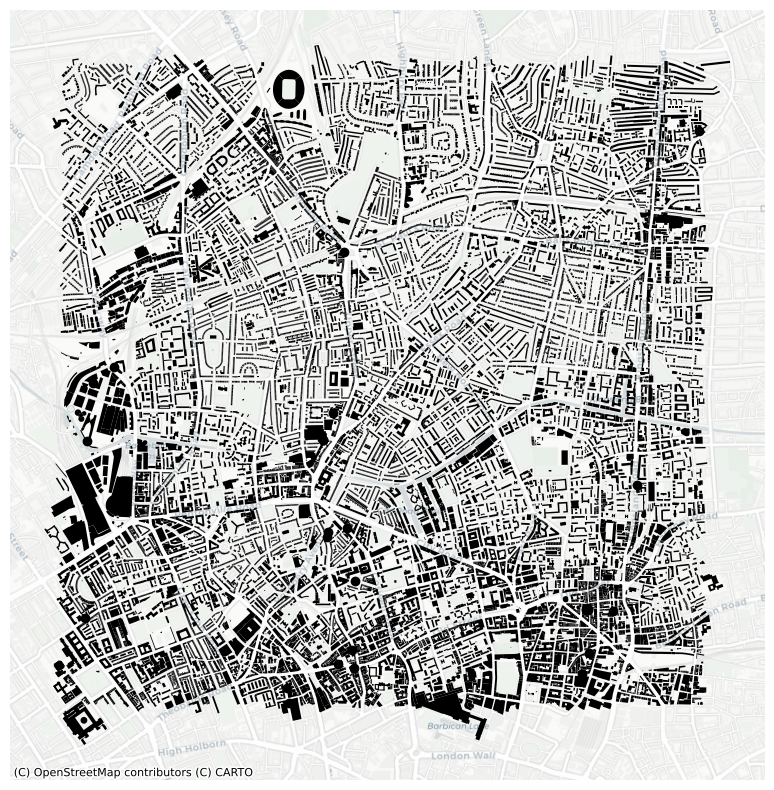

In [15]:
# obtain geometries of a place similar to getting a graph 
tags= tags={'amenity': True, 'highway':True, 'landuse':True, 'building':True, 'waterway': True, 'railway': True}
all_geom=ox.features_from_address('Islington, London,UK', tags, dist=2000)
all_geom = all_geom.to_crs(epsg=3857)

# plot
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].notna()].plot(ax=ax,color='black')
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

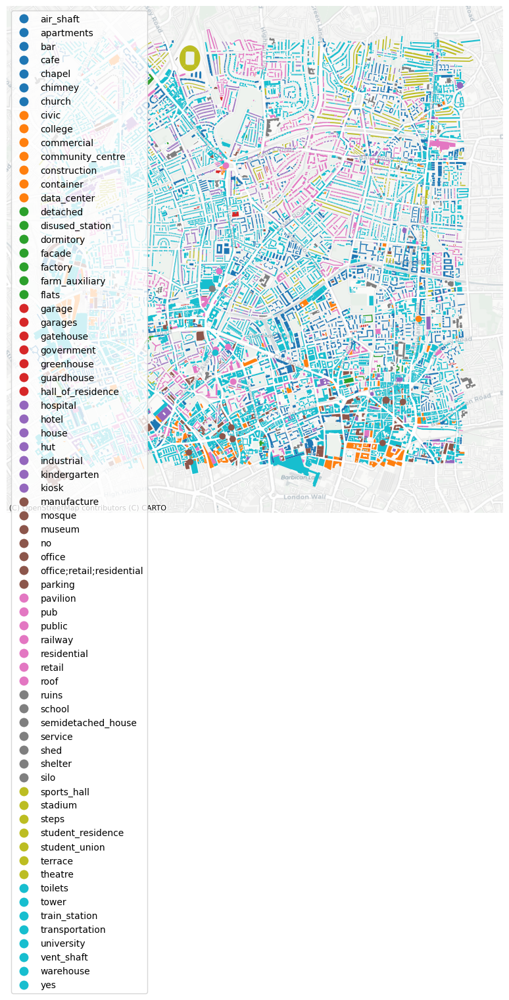

In [17]:
#lets take a look at how buildings are allocated by category 

fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].notna()].plot('building',
                                            ax=ax,
                                            categorical=True,
                                            legend=True)
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

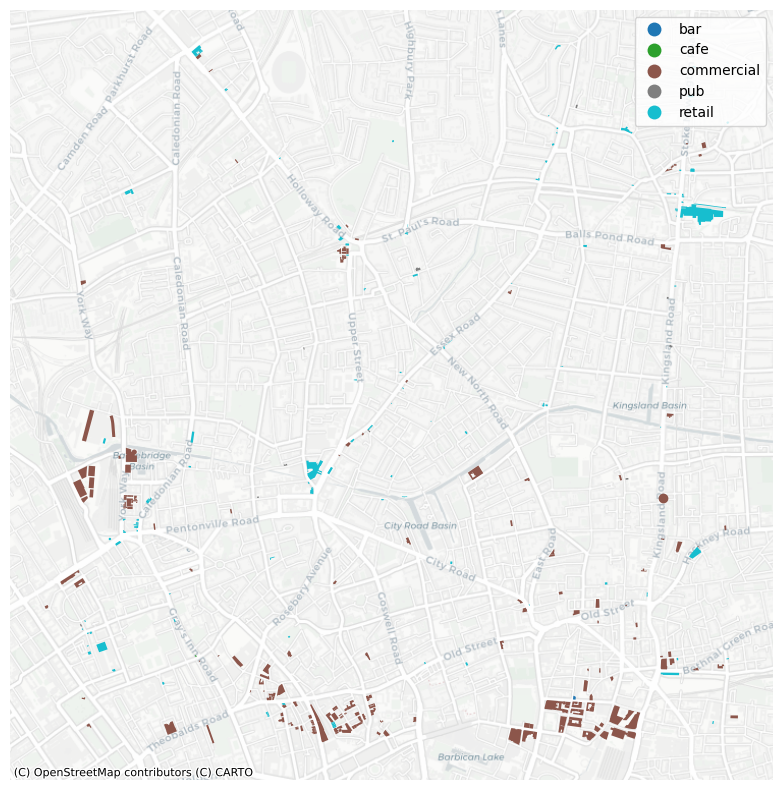

In [23]:
#now lets just categorize by retail

fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].isin(['retail', 'pub', 'cafe', 'bar', 'commercial'])].plot('building',
                                            ax=ax,
                                            categorical=True,
                                            legend=True)
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()

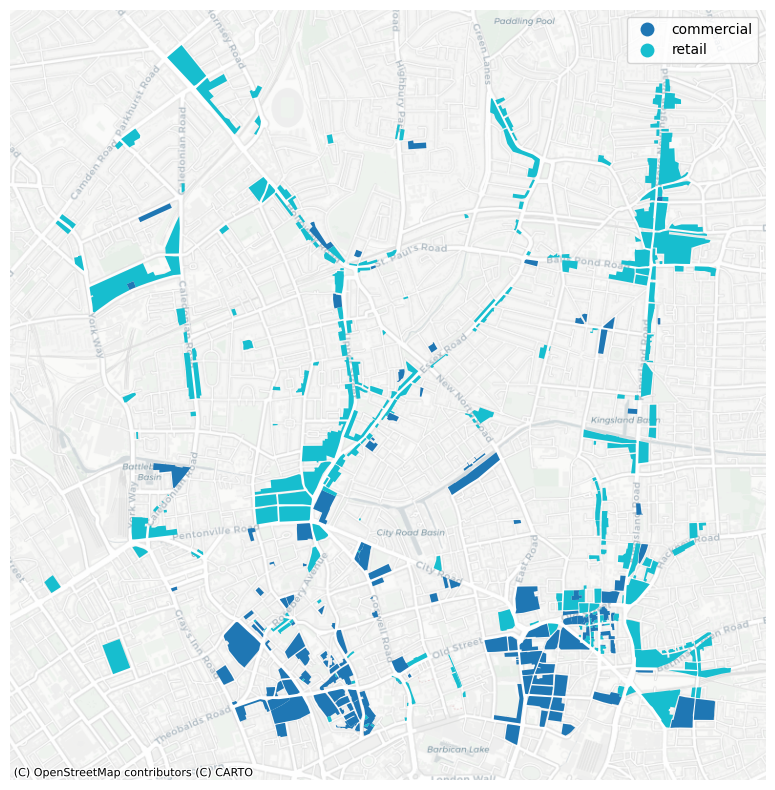

In [26]:
#now lets look at land use for retail allocation 

fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['landuse'].isin(['retail','commercial'])].plot('landuse',
                                            ax=ax,
                                            categorical=True,
                                            legend=True)
import contextily as ctx
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
plt.axis('off')
plt.show()